Mounted at /content/drive


In [4]:
from torchvision import datasets, transforms
from torch.utils.data import TensorDataset, random_split, DataLoader

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [5]:
#base import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random as rand
import cv2
import imghdr
from PIL import Image
import os
import numpy as np
from PIL import Image
from sklearn.utils import shuffle

C:\Users\Evan\AppData\Local\Temp\ipykernel_10232\2510167941.py:8: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [1]:
# evalutation imports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [33]:

# basic variables

seed = 42
img_dim = 64

train_path = ("Data/ASL_SMALL/asl_alphabet_train")
test_path = ("Data/ASL_SMALL/asl_alphabet_test")

transform = transforms.Compose([
    transforms.Resize((img_dim, img_dim)),
    transforms.ToTensor()
])
g = torch.Generator()
g.manual_seed(seed)
train_dataset = datasets.ImageFolder(root=train_path, transform=transform)
class_names = train_dataset.classes
print(len(class_names), len(train_dataset))



1 87000


In [34]:
train_dataset.samples[20000]

('Data/ASL_SMALL/asl_alphabet_train\\asl_alphabet_train\\G\\G28.jpg', 0)

In [35]:
dataset_size = len(train_dataset)
train_size = int(0.6 * dataset_size)
val_size = int(0.2 * dataset_size)
test_size = dataset_size - train_size - val_size

train_set, val_set, test_set = random_split(train_dataset, [train_size, val_size, test_size], generator=g)

train_loader = DataLoader(train_set, batch_size=100, shuffle=True, generator=g)
val_loader = DataLoader(val_set, batch_size=100, shuffle=True)
test_loader = DataLoader(test_set, batch_size=100, shuffle=True)


print(f"Classes: {len(class_names)}")
print(f"Train: {len(train_set)} | Val: {len(val_set)} | Test: {len(test_set)}")



Classes: 1
Train: 52200 | Val: 17400 | Test: 17400


In [36]:
image, label = train_set[0]
print(image.shape)

torch.Size([3, 64, 64])


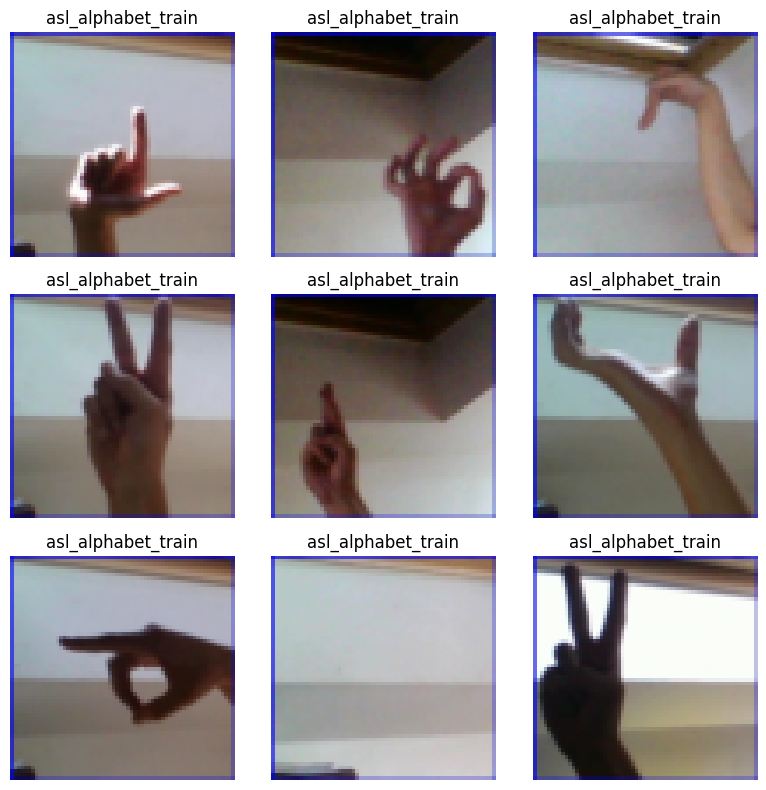

In [37]:
# display some of the images
num_images = 9
rows, cols = 3, 3
plt.figure(figsize=(8, 8))
for i in range(num_images):
    image, label = train_dataset[rand.randint(0, len(train_dataset) - 1)]
    img = image.numpy().transpose((1, 2, 0))

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(class_names[label])
    plt.axis('off')

plt.tight_layout()
plt.show()

In [17]:

def build_cnn_model(num_classes=29):
    class SignLanguageCNN(nn.Module):
        def __init__(self):
            super().__init__()
            self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
            self.pool1 = nn.MaxPool2d(2, 2)

            self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
            self.pool2 = nn.MaxPool2d(2, 2)

            self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
            self.pool3 = nn.MaxPool2d(2, 2)

            self.flattened_size = 128 * 8 * 8
            self.fc1 = nn.Linear(self.flattened_size, 256)
            self.dropout = nn.Dropout(0.5)
            self.fc2 = nn.Linear(256, num_classes)

        def forward(self, x):
            x = self.pool1(F.relu(self.conv1(x)))
            x = self.pool2(F.relu(self.conv2(x)))
            x = self.pool3(F.relu(self.conv3(x)))
            x = x.view(-1, self.flattened_size)
            x = F.relu(self.fc1(x))
            x = self.dropout(x)
            x = self.fc2(x)
            return x

    return SignLanguageCNN()


In [18]:
#crossEntropy and adam
def setup_training(model, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    return criterion, optimizer


In [19]:
# accuracy
def evaluate(model, data_loader, device):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return 100 * correct / total


In [20]:
# training loops
def train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=10):
    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_acc = 100 * correct / total
        val_acc = evaluate(model, val_loader, device)

        print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {running_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Acc: {val_acc:.2f}%")

    print("Training finished.")


In [32]:
print(torch.cuda.is_available())

False


In [16]:
model = build_cnn_model(num_classes=29)
criterion, optimizer = setup_training(model, learning_rate=0.001)

train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=10)


Epoch [1/10] - Loss: 1868.8412, Train Acc: 55.75%, Val Acc: 87.12%
Epoch [2/10] - Loss: 715.3656, Train Acc: 82.15%, Val Acc: 94.50%
Epoch [3/10] - Loss: 487.3226, Train Acc: 87.68%, Val Acc: 96.22%
Epoch [4/10] - Loss: 380.0818, Train Acc: 90.34%, Val Acc: 97.05%
Epoch [5/10] - Loss: 312.5394, Train Acc: 92.10%, Val Acc: 97.92%
Epoch [6/10] - Loss: 266.3813, Train Acc: 93.19%, Val Acc: 98.14%
Epoch [7/10] - Loss: 235.6819, Train Acc: 93.94%, Val Acc: 98.43%
Epoch [8/10] - Loss: 214.7094, Train Acc: 94.49%, Val Acc: 98.56%
Epoch [9/10] - Loss: 192.6366, Train Acc: 95.10%, Val Acc: 98.53%
Epoch [10/10] - Loss: 169.0681, Train Acc: 95.63%, Val Acc: 98.77%
Training finished.


In [18]:
test_acc = evaluate(model, test_loader, device)
print(test_acc)


98.65519096288327


In [39]:
import cv2
import mediapipe as mp
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_hands = mp.solutions.hands

In [58]:
image_path = "Data/ASL_SMALL/asl_alphabet_test/asl_alphabet_test/R_test.jpg"


"""
Isolate a hand in an image and turn the rest black using MediaPipe

Args:
    image_path (str): Path to the input image
    output_path (str): Path to save the output image

Returns:
    bool: True if a hand was found and processed, False otherwise
"""
# Initialize MediaPipe Hand solution
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(
    static_image_mode=True,
    max_num_hands=1,  # Detect only one hand for simplicity
    min_detection_confidence=0.3
)

# Read the image
image = cv2.imread(image_path)
#cv2.imshow("Image", image)
#cv2.waitKey(0)

if image is None:
    print(f"Error: Cannot read image at {image_path}")

# Convert to RGB (MediaPipe uses RGB)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Process the image and detect hands
results = hands.process(image_rgb)

# Check if hand landmarks are detected
if not results.multi_hand_landmarks:
    print("No hands detected in the image.")

# Get image dimensions
h, w, _ = image.shape

# Create a black mask
mask = np.zeros((h, w), dtype=np.uint8)

# Get hand landmarks
hand_landmarks = results.multi_hand_landmarks[0]

# Draw filled polygon connecting all hand landmarks to create a mask
landmarks_xy = []
for landmark in hand_landmarks.landmark:
    x, y = int(landmark.x * w), int(landmark.y * h)
    landmarks_xy.append((x, y))

# Add points to create a more complete hand shape
hull = cv2.convexHull(np.array(landmarks_xy))
cv2.fillConvexPoly(mask, hull, 255)

# Optional: Dilate the mask to include a bit more around the hand
kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

# Create final image with black background
result = image.copy()
for c in range(3):  # Apply the mask to each color channel
    result[:, :, c] = cv2.bitwise_and(result[:, :, c], mask)


cv2.imshow("Image", result)
cv2.waitKey(0)

# Clean up
hands.close()


In [61]:
from rembg import remove
from PIL import Image

In [64]:
input_path = "Data/ASL_SMALL/asl_alphabet_test/asl_alphabet_test/R_test.jpg"
output_path = "new_image.png"

input = Image.open(input_path)
output = remove(input)

output.save(output_path)

In [147]:
from pathlib import Path
from rembg import remove, new_session
from PIL import ImageEnhance, Image
import io

In [169]:

data_path = Path('Data/ASL_SMALL/asl_alphabet_train/asl_alphabet_train/')
output_root = Path('Data/ASL_SMALL_CROPPED/asl_alphabet_train/asl_alphabet_train/')

for folder in data_path.iterdir():
    session = new_session(model_name="u2net")
    output_folder = output_root / folder.name
    output_folder.mkdir(parents=True, exist_ok=True)
    for file in folder.glob('*.jpg'):
        input_path = str(file)
        print("Input: ", input_path)
        output_path = str(output_folder / (file.stem + ".png"))
        print(output_path)

        if os.path.exists(output_path):
            continue

        with open(input_path, 'rb') as i:
            input = i.read()
            output = remove(input, session=session, alpha_matting=False)
            with open(output_path, 'wb') as o:
                o.write(output)

Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A1.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A1.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A10.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A10.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A100.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A100.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A1000.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A1000.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A1001.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A1001.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A1002.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\A1002.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\A\A1003.jpg
Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\A\

In [146]:
session = new_session(model="u2net_human_seg")
input_path = "Data/ASL_SMALL/asl_alphabet_train/asl_alphabet_train/G/G1091.jpg"
output_path = "new_image.png"
with open(input_path, 'rb') as i:
        input = i.read()
        output = remove(input, session=session, alpha_matting=True)
        with open(output_path, 'wb') as o:
            o.write(output)

In [142]:
session = new_session(model="u2net")
input_path = "Data/ASL_SMALL/asl_alphabet_train/asl_alphabet_train/G/G1091.jpg"
output_path = "new_image.png"

from PIL import ImageEnhance, Image
img = Image.open(input_path)
enhancer = ImageEnhance.Contrast(img)
img = enhancer.enhance(1.6)  # Increase contrast slightly
output = remove(img, session=session, alpha_matting=True, 
                        alpha_matting_foreground_threshold=240,
                        alpha_matting_background_threshold=10,
                        alpha_matting_erode_size=15,
                        post_process_mask=True)
output.show()

In [168]:
data_path = Path('Data/ASL_SMALL/asl_alphabet_train/asl_alphabet_train/G')
output_root = Path('Data/ASL_SMALL_CROPPED/asl_alphabet_train/asl_alphabet_train/G')

session = new_session(model_name="u2net")

for file in data_path.glob('*.jpg'):
    input_path = str(file)
    print("Input: ", input_path)
    output_path = str(output_root / (file.stem + ".png"))
    print("Output: ", output_path)

    #if os.path.exists(output_path):
    #    continue

    with open(input_path, 'rb') as i:
        input = i.read()
        output = remove(input, session=session, alpha_matting=False)
        with open(output_path, 'wb') as o:
            o.write(output)

Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G1.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G1.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G10.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G10.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G100.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G100.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G1000.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G1000.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G1001.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G1001.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G1002.jpg
Output:  Data\ASL_SMALL_CROPPED\asl_alphabet_train\asl_alphabet_train\G\G1002.png
Input:  Data\ASL_SMALL\asl_alphabet_train\asl_alphabet_train\G\G1003.jpg
Output:  